## Эта тетрадка содержит основной код для обучения модели

## В начале в соответствии с тем, как показано в ноутбуке @segmentation_dataset_example создаем датасет для обучения. В нашей команде, датасет создавали два человека, поэтому при переводе полигона точек в карту сегментации понадобилось два разных метода: один, чтобы перевести точки одного разметчика; и другой - другого

## В целом нет ничего интересного, и просто важно понимать, что в конце создается датасет для обучения модели

In [1]:
import json

In [2]:
import sys
# insert at 1, 0 is the script path (or '' in REPL)
sys.path.insert(1, './PraNet/')

In [3]:
import matplotlib.pyplot as plt

In [4]:
def flood_fill(edge, dots):
    attempt = 1
    sign = 1
    max_square = 0
    the_best = None
    while attempt <= 10 and len(dots) > attempt:
        dot1 = dots[0]
        dot2 = dots[min(attempt, len(dots)-1)]
        dot = ((dot1[0]+dot2[0])//2,(dot1[1]+dot2[1])//2)
        dot = [max(0, dot[0]), max(0,dot[1])]
        dot = (400,400)#(min(dot[0],edge.shape[0]-1), min(dot[1], edge.shape[1]-1))
        
        im_flood_fill = edge.copy()
        h, w = edge.shape[:2]
        mask = np.zeros((h + 2, w + 2), np.uint8)
        im_flood_fill = im_flood_fill.astype("uint8")

        im_flood_fill=cv.floodFill(im_flood_fill, mask, dot, 1)[1].astype('float')
        if np.mean(im_flood_fill) > 0.85: # and np.mean(im_flood_fill) < 0.85:
            im_flood_fill = 1 - im_flood_fill
        elif im_flood_fill[0,0] > 0 or im_flood_fill[-1,-1] > 0 or im_flood_fill[-1,0] > 0 or im_flood_fill[0,-1] > 0:  # these points should be defintely zero!
            im_flood_fill[:] = 0
        
        if max_square < np.mean(im_flood_fill):
            max_square = np.mean(im_flood_fill)
            the_best = im_flood_fill
        #if np.mean(im_flood_fill) > 0.0007:
            #print(np.mean(im_flood_fill))
        #return im_flood_fill
        
        attempt += 1
        #sign = (-1) * sign
    
    #print("Faul")
    return the_best


def make_seg_map(seg_map, edges, x,y):
    l = list(zip(x,y))
    #|print(len(l))
    vectors = []
    dots = []
    
    edge = np.zeros(seg_map.shape[0:2])
    #edge[0,:] = 1
    #edge[:,0] = 1
    #edge[-1,:] = 1
    #edge[:,-1] = 1
    
    for i in range(1, len(l)+1):
        x1 = l[i-1][0]
        y1 = l[i-1][1]
        if i == len(l):
            x2 = l[0][0]
            y2 = l[0][1]
        else:
            x2 = l[i][0]
            y2 = l[i][1]


        dots.append((int(x1),int(y1)))

        ls = np.linspace((y1,x1), (y2,x2),num=2*int(np.sqrt((x2-x1)**2+(y2-y1)**2)))
        #print(ls)
        for ll in ls:
            #print(ll[0])
            ll = [int(ll[0]), int(ll[1])]
            ll[0] = max(0, ll[0])
            ll[1] = max(0, ll[1])
            
            ll[0] = min(edge.shape[0]-1, ll[0])
            ll[1] = min(edge.shape[1]-1, ll[1])
            edge[ll[0], ll[1]] = 1.0
       
        
    
    im_flood_fill = flood_fill(edge, dots)
    
    edges += edge
    #if np.mean(im_flood_fill > 0.0005):
        
    
    #print(im_flood_fill.mean())
    if im_flood_fill is not None:
        seg_map += im_flood_fill
    #plt.imshow(im_flood_fill)
    return seg_map, edges
    #print(im_flood_fill)

In [5]:
import os

In [6]:
imgs = [x[:-4] for x in os.listdir("./dataset/") if 'jpg' in x]

In [7]:
dataset=[]

In [8]:
import cv2 as cv

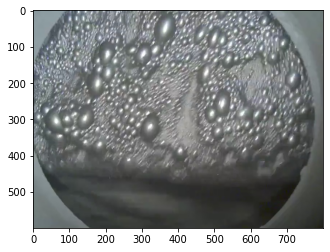

In [9]:
import numpy as np
from PIL import Image

for img_name in imgs:
    with open("./dataset/"+img_name+".json", "r") as file:
        ann = json.load(file)
    
    img = plt.imread("./dataset/"+img_name+".jpg")
    seg_map = np.zeros(img.shape[0:2])
    edges = np.zeros(img.shape[0:2])
    if img.shape[-1] == 4:
        img = img[:,:,0:3]
    
    
    
    plt.imshow(img)
    for i in range(0, len(ann['annotations'])):
        x=ann['annotations'][i]['segmentation'][0][::2]
        y=ann['annotations'][i]['segmentation'][0][1::2]
        x.append(x[0])
        y.append(y[0])
        seg_map, edges = make_seg_map(seg_map, edges, x,y)
        #plt.plot(x,y, c='white')
    
    #print(seg_map.max(), img.max(), seg_map.shape, img.max())
    #img = np.array(Image.fromarray((img).astype('uint8')) #.resize((800,600)))
    seg_map = (seg_map*255).astype('uint8') # np.array(Image.fromarray((seg_map*255).astype('uint8')).resize((800,600)))
    dataset.append((img, seg_map))
    
    #break

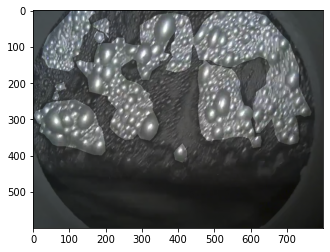

In [10]:
plt.imshow(img/255*0.5 + 0.5*img/255*seg_map[:,:,None]/255)

In [11]:
to_flip = ['F2_2_3_1', 'F2_2_2_2', 'F1_2_4_2', 'F2_2_1_1', 'F1_2_4_1', 'F1_2_3_1', 'F2_2_1_2', 'F2_1_1_1', 'F2_1_2_2','F2_2_2_1','F1_2_3_2', 'F2_1_2_1']

## Now load dataset Anton collected

In [12]:
dataset_artem = dataset
dataset_anton = []

In [13]:
def flood_fill(edge, dots, flip):
    attempt = 1
    sign = 1
    max_square = 0
    the_best = None
    while attempt <= 10 and len(dots) > attempt:
        dot1 = dots[0]
        dot2 = dots[min(attempt, len(dots)-1)]
        dot = ((dot1[0]+dot2[0])//2,(dot1[1]+dot2[1])//2)
        dot = [max(0, dot[0]), max(0,dot[1])]
        dot = (400,400)#(min(dot[0],edge.shape[0]-1), min(dot[1], edge.shape[1]-1))
        
        im_flood_fill = edge.copy()
        h, w = edge.shape[:2]
        mask = np.zeros((h + 2, w + 2), np.uint8)
        im_flood_fill = im_flood_fill.astype("uint8")

        im_flood_fill=cv.floodFill(im_flood_fill, mask, dot, 1)[1].astype('float')
        if np.mean(im_flood_fill) > 0.5: # and np.mean(im_flood_fill) < 0.85:
            im_flood_fill = 1 - im_flood_fill
        
        elif im_flood_fill[0,0] > 0 or im_flood_fill[-1,-1] > 0 or im_flood_fill[-1,0] > 0 or im_flood_fill[0,-1] > 0:  # these points should be defintely zero!
            im_flood_fill[:] = 0
        
        if max_square < np.mean(im_flood_fill):
            max_square = np.mean(im_flood_fill)
            the_best = im_flood_fill
        #if np.mean(im_flood_fill) > 0.0007:
            #print(np.mean(im_flood_fill))
        #return im_flood_fill
        
        attempt += 1
        #sign = (-1) * sign
    
    #print("Faul")
    
    return 1- the_best if flip else the_best


def make_seg_map(seg_map, edges, x,y, flip):
    
    l = list(zip(x,y))
    #|print(len(l))
    vectors = []
    dots = []
    
    edge = np.zeros(seg_map.shape[0:2])
    #edge[0,:] = 1
    #edge[:,0] = 1
    #edge[-1,:] = 1
    #edge[:,-1] = 1
    
    for i in range(1, len(l)+1):
        x1 = l[i-1][0]
        y1 = l[i-1][1]
        if i == len(l):
            x2 = l[0][0]
            y2 = l[0][1]
        else:
            x2 = l[i][0]
            y2 = l[i][1]


        dots.append((int(x1),int(y1)))

        ls = np.linspace((y1,x1), (y2,x2),num=2*int(np.sqrt((x2-x1)**2+(y2-y1)**2)))
        #print(ls)
        for ll in ls:
            #print(ll[0])
            ll = [int(ll[0]), int(ll[1])]
            ll[0] = max(0, ll[0])
            ll[1] = max(0, ll[1])
            
            ll[0] = min(edge.shape[0]-1, ll[0])
            ll[1] = min(edge.shape[1]-1, ll[1])
            edge[ll[0], ll[1]] = 1.0
       
        
    
    im_flood_fill = flood_fill(edge, dots,flip)
    
    edges += edge
    #if np.mean(im_flood_fill > 0.0005):
        
    
    #print(im_flood_fill.mean())
    if im_flood_fill is not None:
        seg_map += im_flood_fill
    #plt.imshow(im_flood_fill)
    return seg_map, edges
    #print(im_flood_fill)

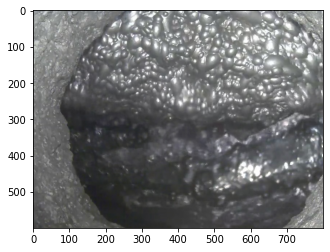

In [14]:
import numpy as np
from PIL import Image

imgs = [x[:-4] for x in os.listdir("./dataset_anton/") if 'jpg' in x]
for img_name in imgs:
    with open("./dataset_anton/"+img_name+".json", "r") as file:
        ann = json.load(file)
    
    img = plt.imread("./dataset_anton/"+img_name+".jpg")
    seg_map = np.zeros(img.shape[0:2])
    edges = np.zeros(img.shape[0:2])
    if img.shape[-1] == 4:
        img = img[:,:,0:3]
    
    
    
    plt.imshow(img)
    for i in range(0, len(ann['annotations'])):
        x=ann['annotations'][i]['segmentation'][0][::2]
        y=ann['annotations'][i]['segmentation'][0][1::2]
        x.append(x[0])
        y.append(y[0])
        seg_map, edges = make_seg_map(seg_map, edges, x,y, img_name in to_flip)
        #plt.plot(x,y, c='white')
    
    #print(seg_map.max(), img.max(), seg_map.shape, img.max())
    #img = np.array(Image.fromarray((img).astype('uint8')) #.resize((800,600)))
    seg_map = (seg_map*255).astype('uint8') # np.array(Image.fromarray((seg_map*255).astype('uint8')).resize((800,600)))
    dataset_anton.append((img, seg_map))
    
    #break

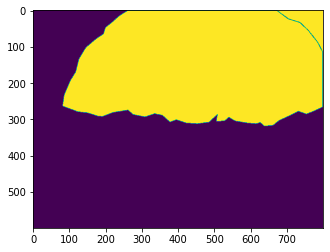

In [15]:
plt.imshow(seg_map)

In [17]:
dataset = dataset_anton+dataset_artem

## В этом месте датасет для обучения готов. Переведем его теперь в pytorch тензоры. Не забудем поаугментировать, так как датасет у нас всего на 50 картинок.

In [19]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import random



def get_dataset(transformation, dataset, seeds_amount=100, show_examples_amount=0):
    Images = []
    Segmented = []
    
    example_shown = 0
    for d in dataset:
        img=d[0]
        outline =d[1]
        
        
        seeds = np.random.randint(0, seeds_amount * 15, seeds_amount)
        for seed in seeds:
            random.seed(seed)
            torch.manual_seed(seed)
            img_trnsfrmd=transformation(img).numpy()
            img_trnsfrmd=img_trnsfrmd.transpose(1,2,0)

            random.seed(seed)
            torch.manual_seed(seed)
            outline_trnsfrmd=transformation(outline).numpy()
            outline_trnsfrmd=outline_trnsfrmd.squeeze()

            Images.append(img_trnsfrmd)
            Segmented.append(outline_trnsfrmd)

            if (example_shown < show_examples_amount) and (np.random.binomial(1, 0.05) == 1):
                ### show some example
                f, ax = plt.subplots(2,2, figsize=(6,6))
                
                ax[0][0].set_title('original image')
                ax[0][0].imshow(img)
                
                ax[0][1].set_title('transformed original image')
                ax[0][1].imshow(img_trnsfrmd)
                
                ax[1][0].set_title('outline image')
                ax[1][0].imshow(outline, cmap='gray')
                
                ax[1][1].set_title('transformed outline image')
                ax[1][1].imshow(outline_trnsfrmd, cmap='gray')
                plt.show()
                example_shown +=1
    
    Images_npy_array = np.array(Images).transpose(0,3,1,2)  # transpose for the torch image format: C,W,H
    Images_tensor = torch.from_numpy(Images_npy_array).type(torch.FloatTensor)
    
    Segmented_npy_array = np.array(Segmented)[:,None]
    Segmented_tensor = torch.from_numpy(Segmented_npy_array).type(torch.FloatTensor)
    
    Dataset = torch.cat((Images_tensor, Segmented_tensor), dim=1)
    return Dataset

In [21]:
from torchvision import transforms

transform_train = transforms.Compose([
    transforms.ToPILImage(),
    #transforms.Resize((504, 800)), 
    transforms.RandomCrop((448, 672)), 
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(90),
    transforms.ToTensor(),
])

In [22]:
from sklearn.model_selection import train_test_split

train_dataset, test_dataset = train_test_split(dataset, test_size=0.2)
len(train_dataset), len(test_dataset)

(40, 10)

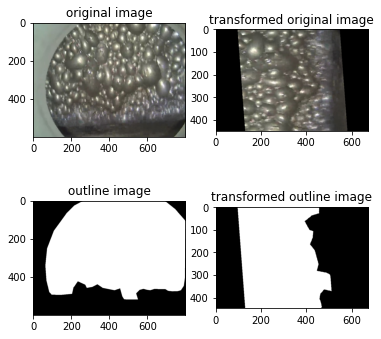

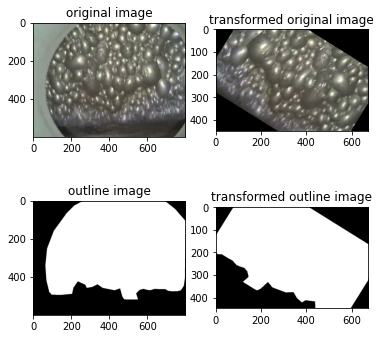

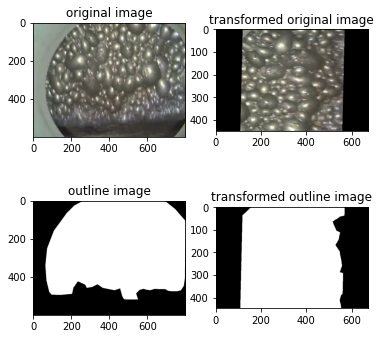

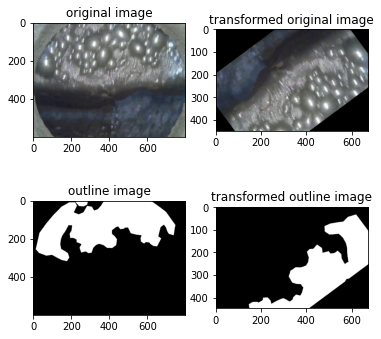

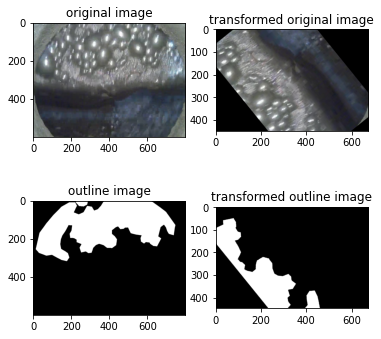

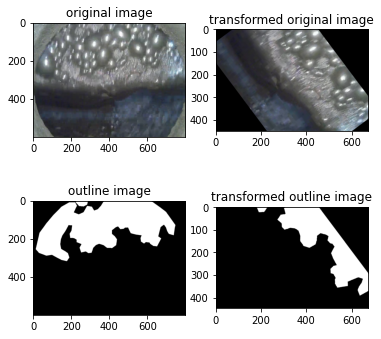

In [23]:
Train = get_dataset(transform_train,train_dataset, show_examples_amount=3)
Test = get_dataset(transform_train,test_dataset, show_examples_amount=3)

## А дальше учим, используя оптимизатор Adamax. loss - segmentation_loss (bce loss + dice_loss)

In [24]:
from torch.utils.data import Dataset, DataLoader
from torch.nn import BCELoss

import torch.optim as optim
import torch

def get_segmentation_loss(segmented_predicted, ground_truth):
    bce_loss = BCELoss()(segmented_predicted, ground_truth)
    dice_loss = 2 * (segmented_predicted * ground_truth).sum() / (torch.sum(segmented_predicted)+torch.sum(ground_truth))
    dice_loss = dice_loss.clamp(1e-7)
    loss = bce_loss - torch.log(dice_loss)
    return loss

loss_function = get_segmentation_loss

In [25]:
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
BATCH_SIZE=32
    

def train(model, train_dataset, test_dataset, num_epoch=32):
    model.double()
    gd = optim.Adamax(model.parameters(), lr=0.008)
    dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    losses = []
    for epoch in range(num_epoch):
        print(f'Epoch # {epoch}')
        model.eval()
        sift(model, train_dataset, test_dataset, cuda=True)
        model.train()
        for i, (batch) in enumerate(dataloader):
            images = batch[:,:-1,:,:]
            segm = batch[:,-1,:,:]
            segm = segm[:,None].cuda()  # load to gpu and transform shape, so that 
                                        # it was in accord with network segmentation output
            
            gd.zero_grad()
            segmented_predicted = model(images.cuda())
            
            loss = loss_function(segmented_predicted, segm) # (segm - segmented_predicted.cpu()).norm()
            loss.backward()
            losses.append(loss.detach().cpu().numpy())
            gd.step()
            gd.zero_grad()
            images.cpu()  # Well, seems without cpu transfering gpu memory runs out
        print("#%i, Train loss: %.7f"%(epoch+1,np.mean(losses)),flush=True)

In [26]:
import torch
from lib.PraNet_Res2Net import PraNet

In [27]:
net = PraNet().float().cuda()

In [30]:
import torch
import matplotlib.pyplot as plt
import numpy as np

from torch import nn

DEVICE='cuda'

def sift(model, train_dataset, test_dataset, thres=0.3):
    i_train = np.random.randint(0, train_dataset.shape[0], 1)[0]
    i_test = np.random.randint(0, test_dataset.shape[0], 1)[0]
    
    img_train = train_dataset[i_train, :-1]
    seg_train = train_dataset[i_train, -1]
    
    img_test = test_dataset[i_test, :-1]
    seg_test = test_dataset[i_test, -1]
    
    images_segs_names = [(img_train, seg_train, 'train'), (img_test, seg_test, 'test')]
    #print(img_train[None].shape)
    #return
    f, ax = plt.subplots(2,4, figsize=(32,16))
    for i, img_seg_name in enumerate(images_segs_names):
        img, seg, name = img_seg_name
        #print(img.shape)
        reco = model(img[None].to(device=DEVICE))[-1] #handle_by_crops(img[None], model, 224*3, 0, device=DEVICE)
        sigmoid = nn.Sigmoid()
        reco = sigmoid(reco)
        #reco = (reco - reco.min()) / (reco.max() - reco.min() + 1e-8)
        ax[i][0].set_title(f'original {name}')
        ax[i][0].imshow(img.numpy().transpose(1,2,0).clip(0,1))

        ax[i][1].set_title(f'outline {name} ground truth')
        ax[i][1].imshow(seg.numpy().clip(0,1), 'gray')

        ax[i][2].set_title(f'segmented {name} NN predicted')
        ax[i][2].imshow(reco[0][0].detach().cpu().numpy().clip(0,1), 'gray')
        
        ax[i][3].set_title(f'segmented {name} NN predicted thresholded ({thres})')
        ax[i][3].imshow(reco[0][0].detach().cpu().numpy().clip(0,1) > thres, 'gray')
        

    plt.show()

## Посмотрим, что нам дает сетка до обучения. Ожидаем мусор.

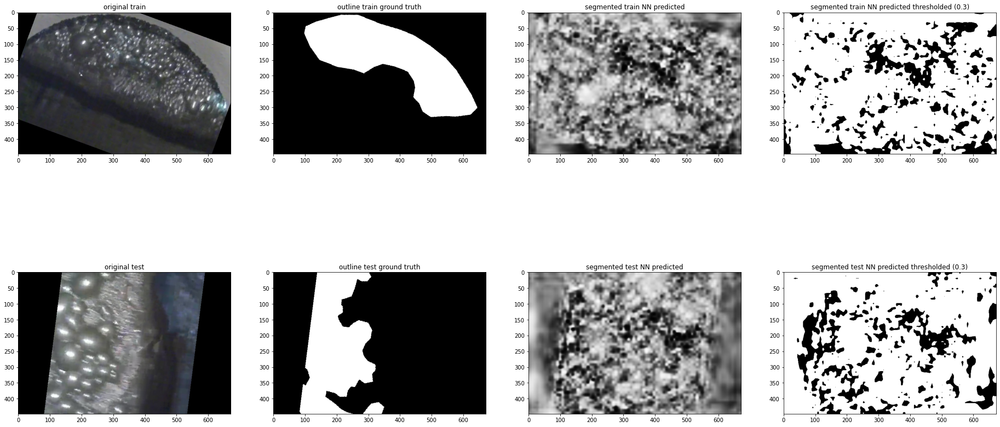

In [32]:
sift(net, Train, Test)

In [33]:
import torch.nn.functional as F
import torch 

def structure_loss(pred, mask):
    weit = 1 + 5*torch.abs(F.avg_pool2d(mask, kernel_size=31, stride=1, padding=15) - mask)
    wbce = F.binary_cross_entropy_with_logits(pred, mask, reduce='none')
    wbce = (weit*wbce).sum(dim=(2, 3)) / weit.sum(dim=(2, 3))

    pred = torch.sigmoid(pred)
    inter = ((pred * mask)*weit).sum(dim=(2, 3))
    union = ((pred + mask)*weit).sum(dim=(2, 3))
    wiou = 1 - (inter + 1)/(union - inter+1)
    return (wbce + wiou).mean()

In [34]:
from collections import defaultdict

## Мы готовы обучать модель! Здесь идет просчет метрики dice после каждой тренировочной итерации и сохранение весов модели

Epoch # 0


/home/boyarintsev.artem/catboost/venv/lib/python3.6/site-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


#1, Train loss: 2.7310269
Dice = (0.7000000000000001, 0.8705574474219777). Loss = 0.4088805317878723
Rewrite best dice... When thres=0.7000000000000001, dice=0.8705574474219777


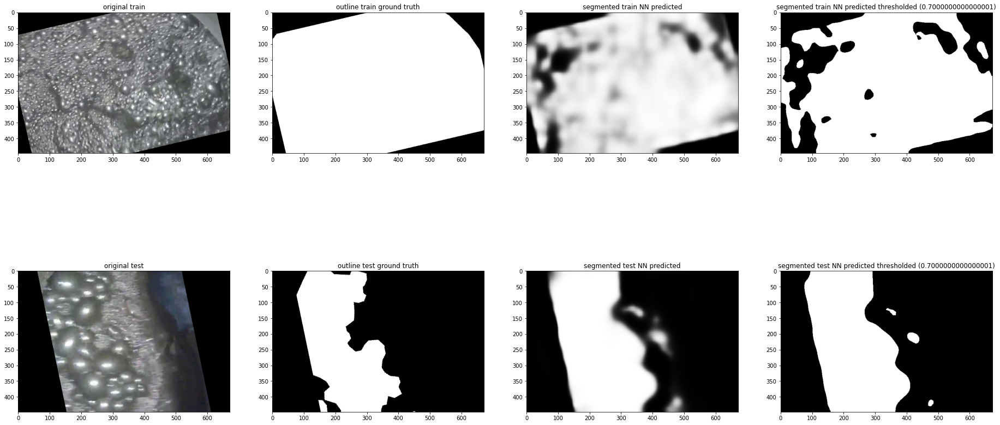

[2.731027]
[0.40888053]
Epoch # 1
#2, Train loss: 2.0045018
Dice = (0.1, 0.7101324770038168). Loss = 1.624616265296936


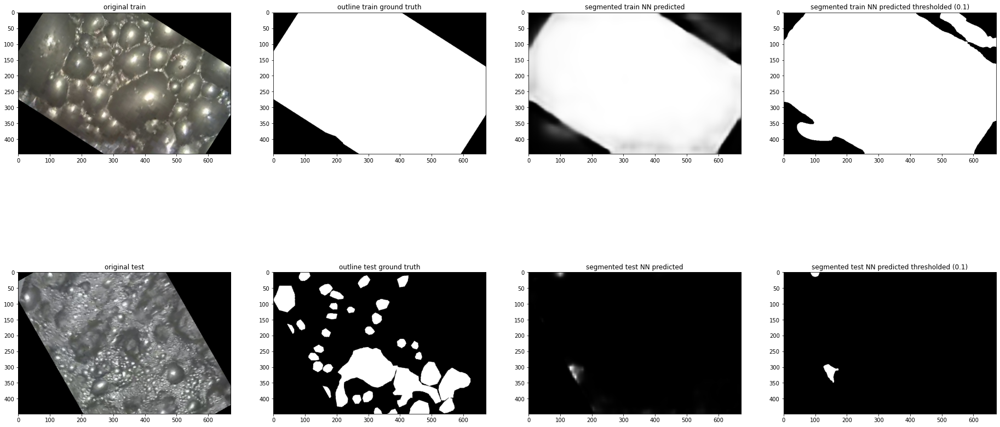

[2.731027, 2.0045018]
[0.40888053, 1.6246163]
Epoch # 2
#3, Train loss: 1.7679415
Dice = (0.6000000000000001, 0.9034425447086143). Loss = 0.2839827835559845
Rewrite best dice... When thres=0.6000000000000001, dice=0.9034425447086143


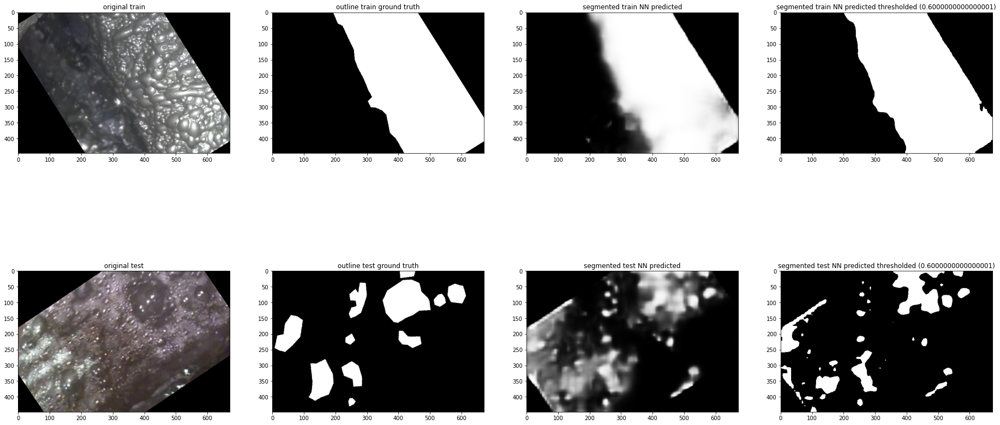

[2.731027, 2.0045018, 1.7679415]
[0.40888053, 1.6246163, 0.28398278]
Epoch # 3
#4, Train loss: 1.5458927
Dice = (0.6000000000000001, 0.9031943168499129). Loss = 0.293448269367218


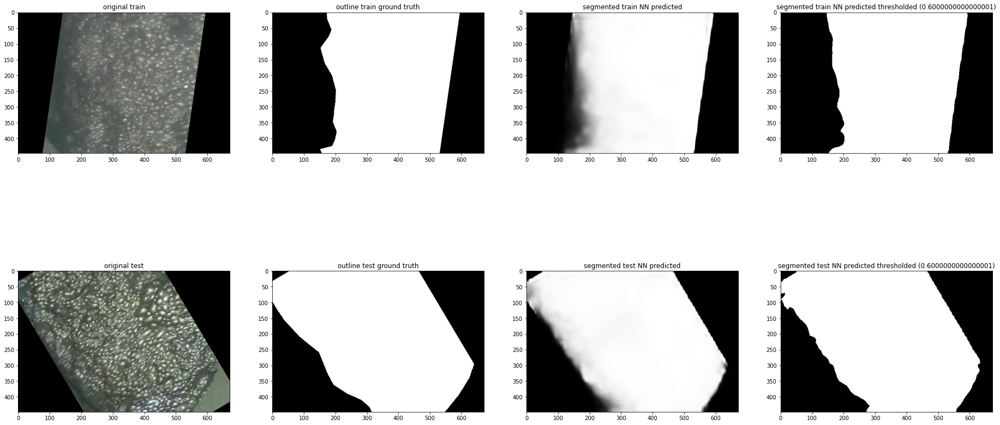

[2.731027, 2.0045018, 1.7679415, 1.5458927]
[0.40888053, 1.6246163, 0.28398278, 0.29344827]
Epoch # 4
#5, Train loss: 1.3425835
Dice = (0.4, 0.8940958870114349). Loss = 0.31460967659950256


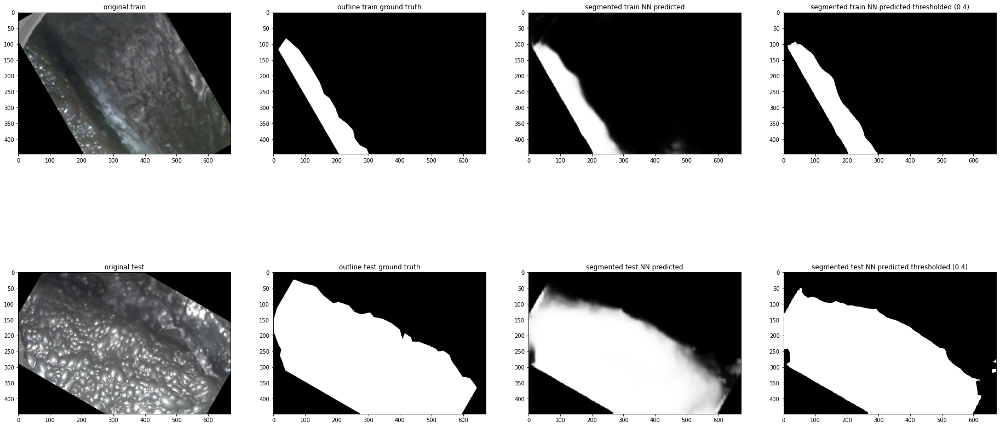

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968]
Epoch # 5
#6, Train loss: 1.1740135
Dice = (0.8, 0.8837679224507503). Loss = 0.36342304944992065


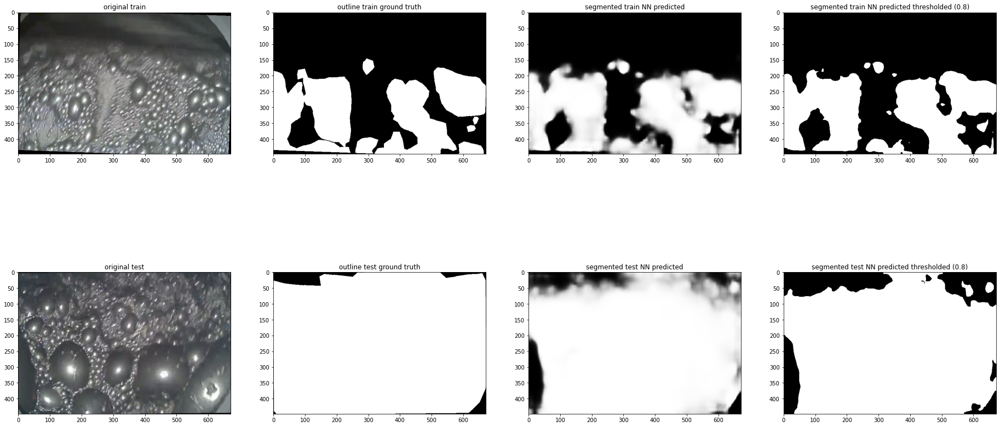

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305]
Epoch # 6
#7, Train loss: 1.0236928
Dice = (0.9, 0.9024299253704176). Loss = 0.34239494800567627


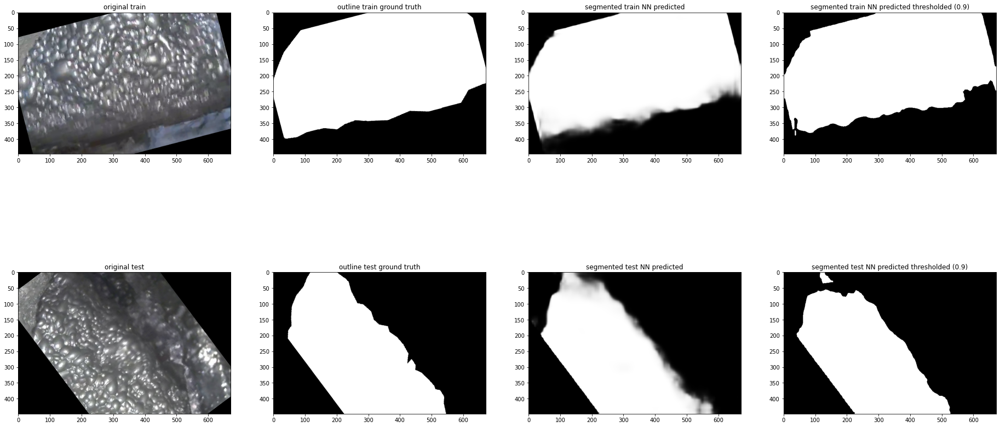

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495]
Epoch # 7
#8, Train loss: 0.9046367
Dice = (0.5, 0.9125635067967935). Loss = 0.26525843143463135
Rewrite best dice... When thres=0.5, dice=0.9125635067967935


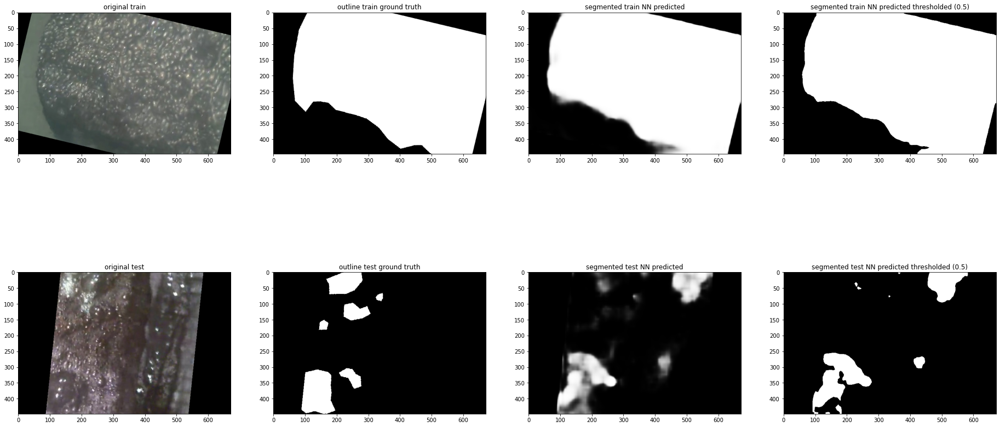

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843]
Epoch # 8
#9, Train loss: 0.8029000
Dice = (0.5, 0.9110544622362504). Loss = 0.2742135524749756


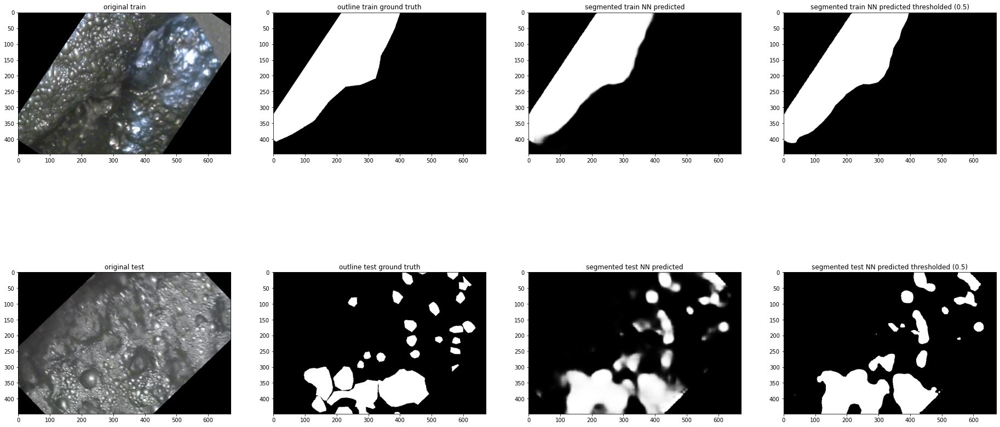

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355]
Epoch # 9
#10, Train loss: 0.7435995
Dice = (0.4, 0.9098870471794344). Loss = 0.3186827003955841


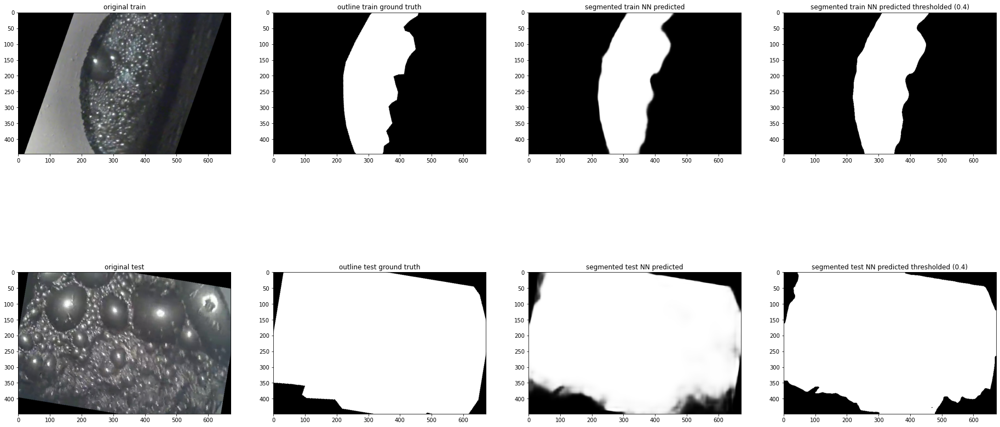

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827]
Epoch # 10
#11, Train loss: 0.6724626
Dice = (0.8, 0.9160274059388341). Loss = 0.28614914417266846
Rewrite best dice... When thres=0.8, dice=0.9160274059388341


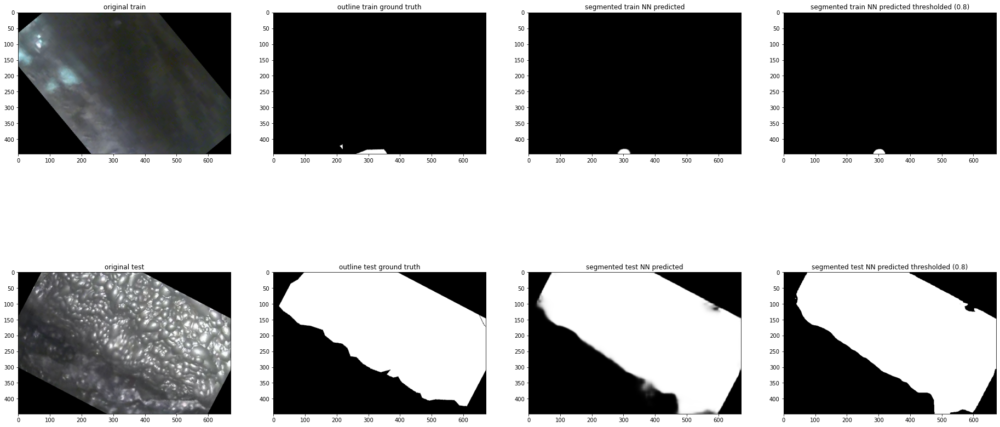

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914]
Epoch # 11
#12, Train loss: 0.6089618
Dice = (0.6000000000000001, 0.9123781791441227). Loss = 0.28863656520843506


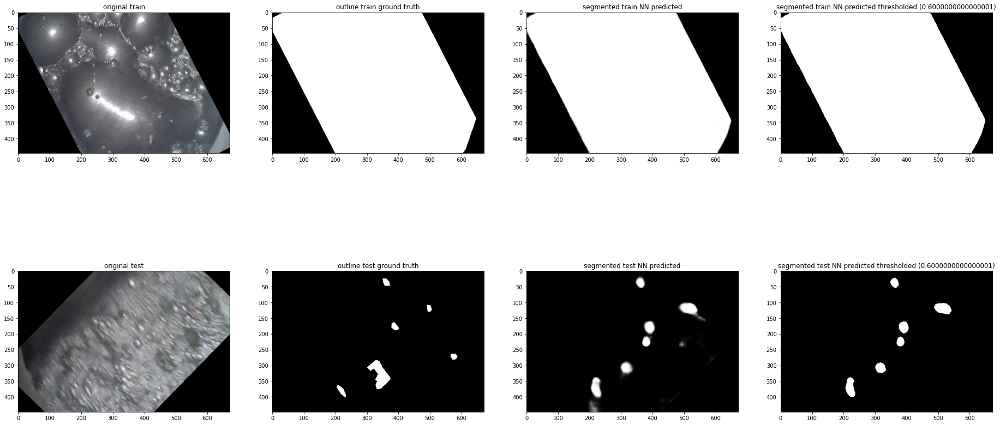

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264, 0.6089618]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914, 0.28863657]
Epoch # 12
#13, Train loss: 0.5548326
Dice = (0.2, 0.8479227971410035). Loss = 0.5436795353889465


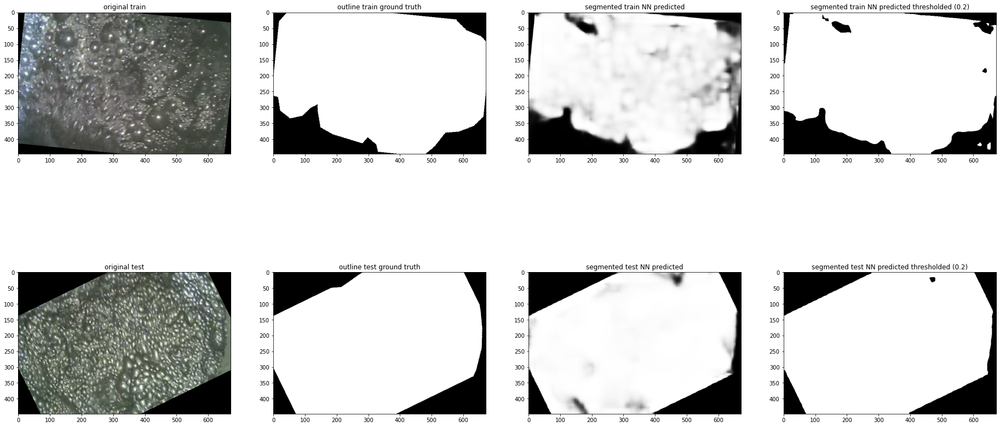

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264, 0.6089618, 0.55483264]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914, 0.28863657, 0.54367954]
Epoch # 13
#14, Train loss: 0.5304707
Dice = (0.6000000000000001, 0.9247833246666938). Loss = 0.2613215744495392
Rewrite best dice... When thres=0.6000000000000001, dice=0.9247833246666938


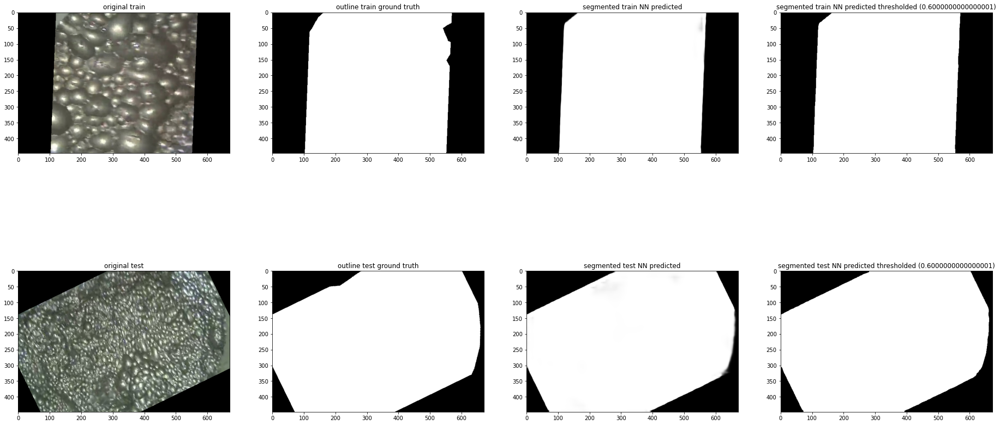

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264, 0.6089618, 0.55483264, 0.53047067]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914, 0.28863657, 0.54367954, 0.26132157]
Epoch # 14
#15, Train loss: 0.4877910
Dice = (0.30000000000000004, 0.917584775295215). Loss = 0.3135165274143219


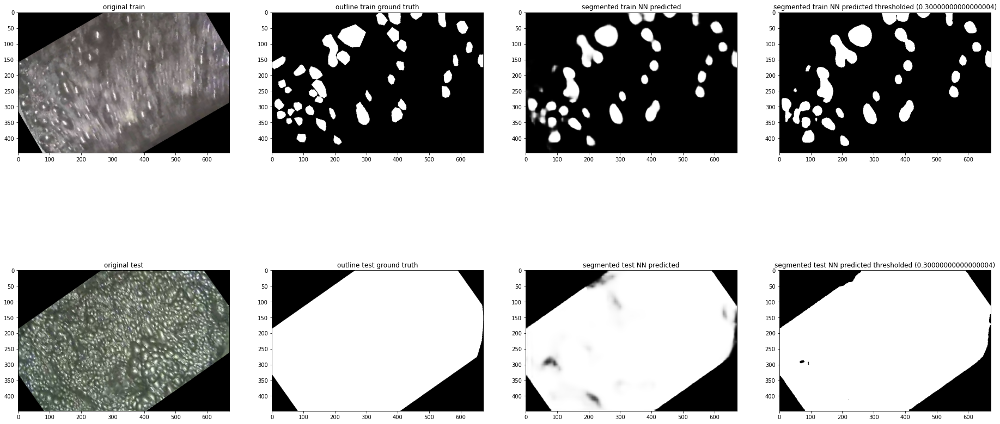

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264, 0.6089618, 0.55483264, 0.53047067, 0.487791]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914, 0.28863657, 0.54367954, 0.26132157, 0.31351653]
Epoch # 15
#16, Train loss: 0.4655423
Dice = (0.30000000000000004, 0.9238644482260566). Loss = 0.29385170340538025


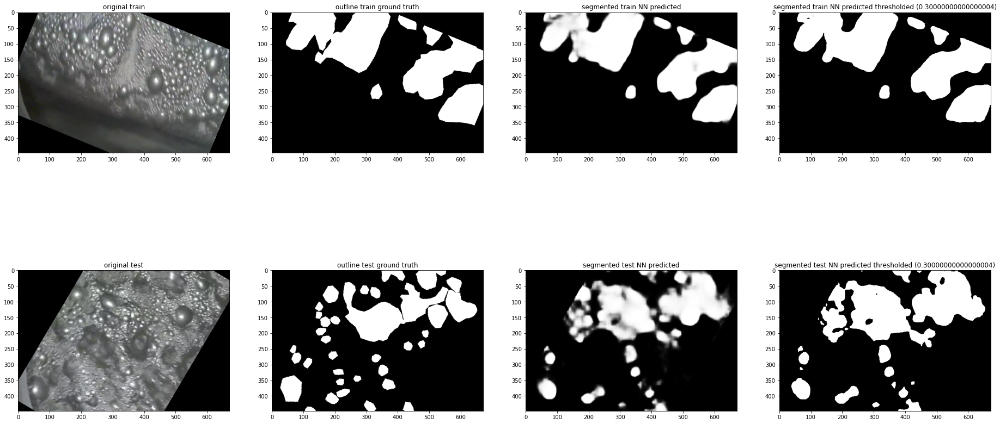

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264, 0.6089618, 0.55483264, 0.53047067, 0.487791, 0.4655423]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914, 0.28863657, 0.54367954, 0.26132157, 0.31351653, 0.2938517]
Epoch # 16
#17, Train loss: 0.4415247
Dice = (0.6000000000000001, 0.9236259970591285). Loss = 0.2707356810569763


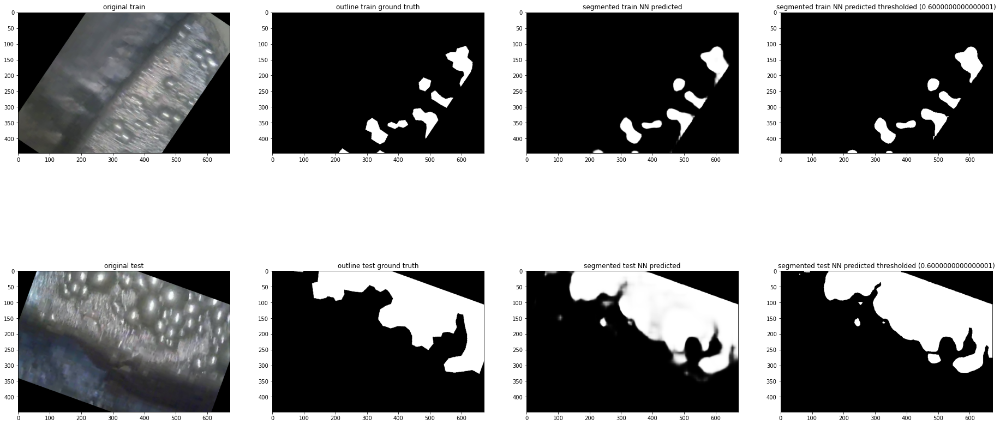

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264, 0.6089618, 0.55483264, 0.53047067, 0.487791, 0.4655423, 0.44152465]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914, 0.28863657, 0.54367954, 0.26132157, 0.31351653, 0.2938517, 0.27073568]
Epoch # 17
#18, Train loss: 0.4095269
Dice = (0.4, 0.9157717939793261). Loss = 0.2956481873989105


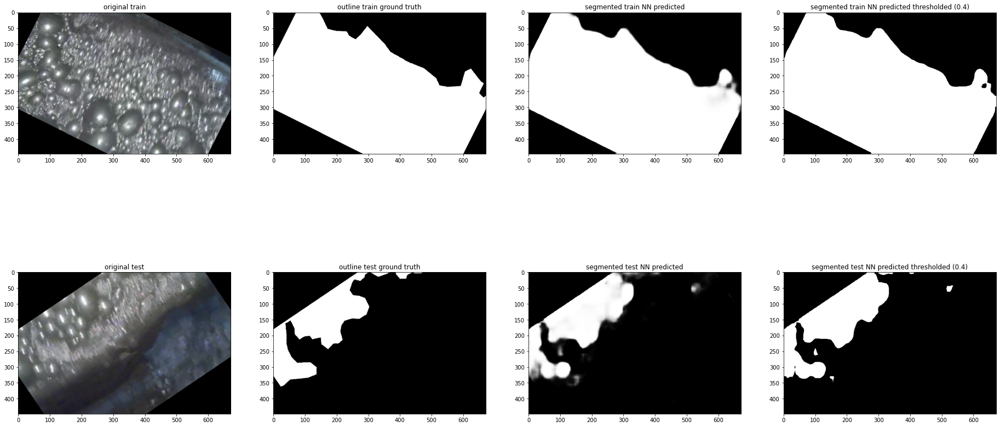

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264, 0.6089618, 0.55483264, 0.53047067, 0.487791, 0.4655423, 0.44152465, 0.40952694]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914, 0.28863657, 0.54367954, 0.26132157, 0.31351653, 0.2938517, 0.27073568, 0.2956482]
Epoch # 18
#19, Train loss: 0.3959986
Dice = (0.30000000000000004, 0.9166084869638643). Loss = 0.3065768778324127


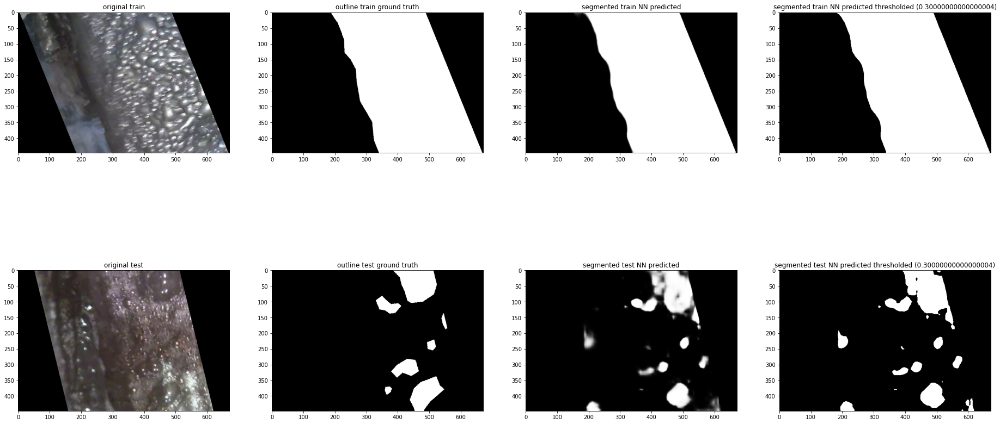

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264, 0.6089618, 0.55483264, 0.53047067, 0.487791, 0.4655423, 0.44152465, 0.40952694, 0.39599857]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914, 0.28863657, 0.54367954, 0.26132157, 0.31351653, 0.2938517, 0.27073568, 0.2956482, 0.30657688]
Epoch # 19
#20, Train loss: 0.4006558
Dice = (0.2, 0.9161853489306807). Loss = 0.3392845392227173


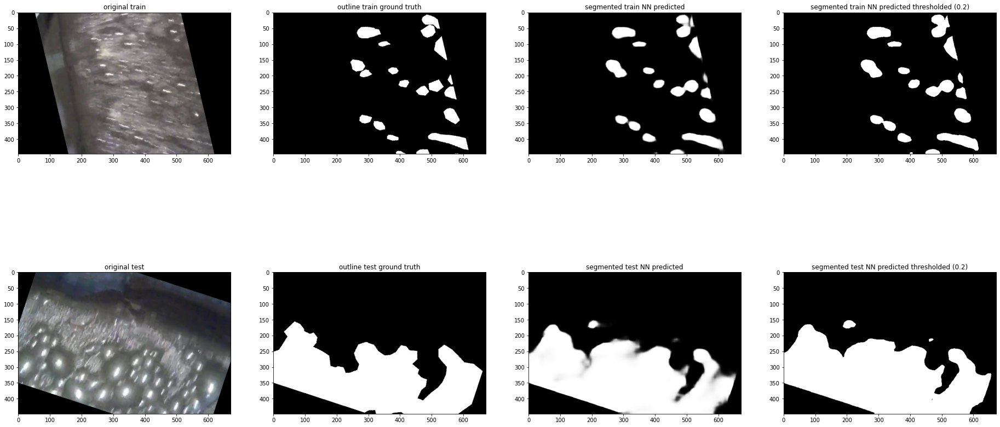

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264, 0.6089618, 0.55483264, 0.53047067, 0.487791, 0.4655423, 0.44152465, 0.40952694, 0.39599857, 0.40065584]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914, 0.28863657, 0.54367954, 0.26132157, 0.31351653, 0.2938517, 0.27073568, 0.2956482, 0.30657688, 0.33928454]
Epoch # 20
#21, Train loss: 0.3921187
Dice = (0.2, 0.9205491066516724). Loss = 0.3073907792568207


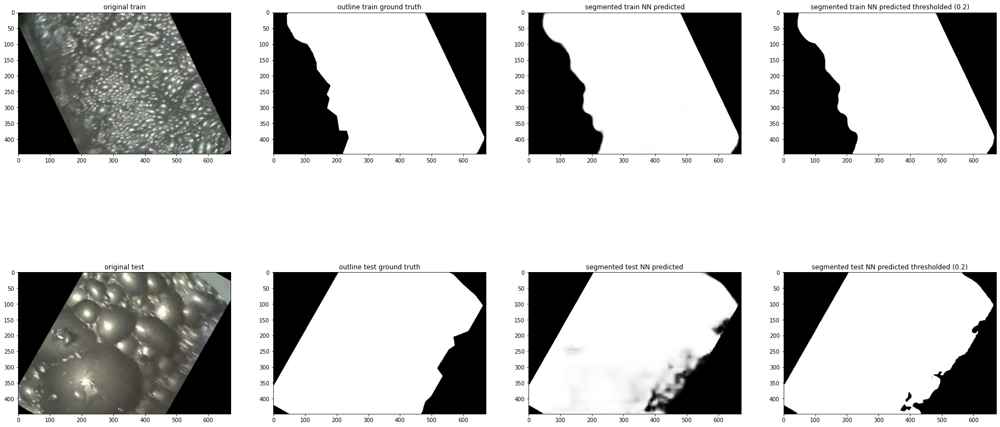

[2.731027, 2.0045018, 1.7679415, 1.5458927, 1.3425835, 1.1740135, 1.0236928, 0.90463674, 0.80289996, 0.74359953, 0.67246264, 0.6089618, 0.55483264, 0.53047067, 0.487791, 0.4655423, 0.44152465, 0.40952694, 0.39599857, 0.40065584, 0.3921187]
[0.40888053, 1.6246163, 0.28398278, 0.29344827, 0.31460968, 0.36342305, 0.34239495, 0.26525843, 0.27421355, 0.3186827, 0.28614914, 0.28863657, 0.54367954, 0.26132157, 0.31351653, 0.2938517, 0.27073568, 0.2956482, 0.30657688, 0.33928454, 0.30739078]
Epoch # 21


KeyboardInterrupt: 

In [35]:
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn import BCELoss, BCEWithLogitsLoss
from torch.nn.utils import clip_grad_norm_
from torch import nn


BATCH_SIZE=3


def calc_dice(prediction, ground_truth):
    n_images = len(prediction)
    intersection, dice_denumerator = 0, 0
    for i in range(n_images):
        intersection += np.logical_and(prediction[i] > 0, ground_truth[i] > 0).astype(np.float32).sum() 
        dice_denumerator += np.sum(prediction[i] > 0) + np.sum(ground_truth[i] > 0)
        
    return float(2*intersection) / dice_denumerator


def calc_dice_single(prediction, ground_truth):
    intersection, dice_denumerator = 0, 0
    
    intersection += np.logical_and(prediction > 0, ground_truth > 0).astype(np.float32).sum()
    dice_denumerator += np.sum(prediction > 0) + np.sum(ground_truth > 0)
        
    return float(2*intersection) / dice_denumerator


def calculate_loss_and_dice(model, test_dataset, batch_size=BATCH_SIZE):
    model = model.eval()
    dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)
    losses = []
    dices = defaultdict(lambda : [])
    margin_size = 112
    sigmoid = nn.Sigmoid()

    for batch in dataloader:
        images = batch[:,:-1,:,:].to(device=DEVICE)
        segmented_ground_truth = batch[:,-1,:,:].to(device=DEVICE)
        
        pred = model(images)
        predicted = sigmoid(pred[-1])
        mask_predicted = predicted.detach() 
        mask_predicted = mask_predicted[:,0] #,margin_size:-margin_size, margin_size:-margin_size]
        
        #mask_predicted = (mask_predicted - mask_predicted.min()) / (mask_predicted.max() - mask_predicted.min() + 1e-8)
        target = segmented_ground_truth.detach()

        eps = 1e-8
        mask_predicted = mask_predicted.clamp(eps, 1.0)
        bce_loss = BCELoss()(mask_predicted, target)
        dice_loss = 2 * (mask_predicted * target).sum() / (torch.sum(mask_predicted)+torch.sum(target) + eps)
        dice_loss = dice_loss.clamp(eps)
        loss = bce_loss - torch.log(dice_loss)
        losses.append(loss.detach().cpu().numpy())
        for thres in np.arange(0.0, 1.0, 0.1):
            #dice = calc_dice_single(mask_predicted[0].detach().cpu().numpy()  > thres, target.detach().cpu().numpy()[0])
            dice = calc_dice_single(mask_predicted.detach().cpu().numpy()  > thres, target.detach().cpu().numpy())
            dices[thres].append(dice)


    dice_mean = {x:np.mean(dices[x]) for x in dices}
    loss_mean = np.mean(losses)
    return dice_mean, loss_mean
    
    
model = net.to(device=DEVICE)
train_dataset = Train
test_dataset = Test
num_epoch = 50

gd = optim.Adamax(model.parameters(), lr=0.01)
dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

losses = []
dice_metrics = []
best_dice = 0.0
cur_best_dice = 0.0

train_losses = []
test_losses = []

sigmoid = nn.Sigmoid()
for epoch in range(num_epoch):
    print(f'Epoch # {epoch}')
    model.train()

    for batch in dataloader:
        images = batch[:,:-1,:,:]
        segmented_ground_truth = batch[:,-1,:,:]

        margin_size =  112
        images = images.to(device=DEVICE)

        mask_predicted_1, mask_predicted_2, mask_predicted_3, mask_predicted_4 = model(images)
        
        
        eps = 1e-8
        #mask_predicted_1 = sigmoid(mask_predicted_1).clamp(eps)
        #mask_predicted_2 = sigmoid(mask_predicted_2).clamp(eps)
        #mask_predicted_3 = sigmoid(mask_predicted_3).clamp(eps)
        #mask_predicted_4 = sigmoid(mask_predicted_4).clamp(eps)
        
        
        #mask_predicted_1 = mask_predicted_1[:,0] #,margin_size:-margin_size, margin_size:-margin_size].clamp(eps)
        #mask_predicted_2 = mask_predicted_2[:,0] #,margin_size:-margin_size, margin_size:-margin_size].clamp(eps)
        #mask_predicted_3 = mask_predicted_3[:,0] #,margin_size:-margin_size, margin_size:-margin_size].clamp(eps)
        #mask_predicted_4 = mask_predicted_4[:,0] #,margin_size:-margin_size, margin_size:-margin_size].clamp(eps)
        
        target = segmented_ground_truth  # [:,margin_size:-margin_size, margin_size: -margin_size]
        target = target.to(device=DEVICE)
        
        target = target[:,None]
        
        gd.zero_grad()
        
        def get_loss(mask_predicted, target):
            #if cur_best_dice >= 0.8:  
                # If model confident enough, then we don't fine it. May be train data are bad and noisy
                #f mask_predicted.max() > 0.75:
             #   big_enough = mask_predicted.max() * 0.9
              #  target = torch.where(mask_predicted > big_enough, torch.ones(target.shape).to(device=DEVICE), target)
            
            return structure_loss(mask_predicted, target)

#        asdf
        loss5 = get_loss(mask_predicted_1, target)
        loss4 = get_loss(mask_predicted_2, target)
        loss3 = get_loss(mask_predicted_3, target)
        loss2 = get_loss(mask_predicted_4, target)
        
        loss = loss2 + loss3 + loss4 + loss5   # TODO: try different weights for loss and different loss at all

        loss.backward()
        losses.append(loss.detach().cpu().numpy())
        #torch.nn.utils.clip_grad_norm_(model.parameters(), 20)
        gd.step()
        gd.zero_grad()



    print("#%i, Train loss: %.7f"%(epoch+1,np.mean(losses)),flush=True)
    
    model.eval()
    
    dice_metric_mean, loss_on_test_mean = calculate_loss_and_dice(model, test_dataset)
    dice_sorted=[(x, dice_metric_mean[x]) for x in dice_metric_mean]
    dice_sorted_best = sorted(dice_sorted, key=lambda x:x[1], reverse=True)[0]
    
    cur_best_dice = dice_sorted_best[1]
    print(f"Dice = {dice_sorted_best}. Loss = {loss_on_test_mean}")
    if dice_sorted_best[1] > best_dice:
        print(f'Rewrite best dice... When thres={dice_sorted_best[0]}, dice={dice_sorted_best[1]}')
        postfix=f'{dice_sorted_best[0]:.4f}_{dice_sorted_best[1]:.4f}'
        torch.save(net.state_dict(), f'./models/model_weights_{postfix}.save')
        best_dice = dice_sorted_best[1]

    torch.save(net.state_dict(), './models/model_weights_regular.save')
    
    sift(model, train_dataset, test_dataset, thres=dice_sorted_best[0])  # Choose random dataset to show the results
    
    train_losses.append(np.mean(losses))
    test_losses.append(loss_on_test_mean)
    losses = []
    print(train_losses)
    print(test_losses)

## Дожидаться окончания я не стал. Лучший dice = 92% - хороший показатель того, что нейросети можно использовать для сегментирования пузырей.